In [ ]:
!pip install deepchem==2.6.1
!pip install shap
!pip install lime
!pip install mols2grid
!pip install XlsxWriter

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.3/608.3 KB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.3/29.3 MB 29.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 575.9/575.9 KB 11.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=65424125a053cfb741f14b36d1dfb762d938d69ff825e58f779bafaaf87b6e58
  Stored in directory: /root/.cache/pip/wheels/e6/a6/20/cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Successfully built lime
Looking in indexes: https://pypi.org/simple, https://us-py

In [ ]:
import deepchem as dc
import shap
from lime import lime_tabular

from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Descriptors
from rdkit.Chem import AllChem
from rdkit import DataStructs
from rdkit.Chem import PandasTools
import mols2grid

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

import pandas as pd
import plotly
import matplotlib.pyplot as plt
import numpy as np
import xlsxwriter
from google.colab import files

np.random.seed(0)
pd.set_option('display.max_rows', None)

In [ ]:
n_features = 1024
limite=24
base_graph = n_features - limite
tasks, datasets, transformers = dc.molnet.load_bbbp(featurization='ecfp')
train_dataset, valid_dataset, test_dataset = datasets

    rdkit.Chem.rdmolfiles.CanonicalRankAtoms(NoneType)
did not match C++ signature:
    CanonicalRankAtoms(RDKit::ROMol mol, bool breakTies=True, bool includeChirality=True, bool includeIsotopes=True)
    rdkit.Chem.rdmolfiles.CanonicalRankAtoms(NoneType)
did not match C++ signature:
    CanonicalRankAtoms(RDKit::ROMol mol, bool breakTies=True, bool includeChirality=True, bool includeIsotopes=True)
    rdkit.Chem.rdmolfiles.CanonicalRankAtoms(NoneType)
did not match C++ signature:
    CanonicalRankAtoms(RDKit::ROMol mol, bool breakTies=True, bool includeChirality=True, bool includeIsotopes=True)
    rdkit.Chem.rdmolfiles.CanonicalRankAtoms(NoneType)
did not match C++ signature:
    CanonicalRankAtoms(RDKit::ROMol mol, bool breakTies=True, bool includeChirality=True, bool includeIsotopes=True)
    rdkit.Chem.rdmolfiles.CanonicalRankAtoms(NoneType)
did not match C++ signature:
    CanonicalRankAtoms(RDKit::ROMol mol, bool breakTies=True, bool includeChirality=True, bool includeIsotopes=T

In [ ]:
data = train_dataset.to_dataframe()
yaxis = []
for col in data.columns:
      if 'X' in col:
            yaxis.append(col)

In [ ]:
X = train_dataset.X
Y = train_dataset.y

**Explain Your Model with the SHAP Values**

In [ ]:
model = RandomForestClassifier(max_depth=6, random_state=0, n_estimators=1)
model.fit(X, Y.ravel())  
print(model.feature_importances_)

[0. 0. 0. ... 0. 0. 0.]


In [ ]:
test_dataset

<DiskDataset X.shape: (204, 1024), y.shape: (204, 1), w.shape: (204, 1), ids: ['CCOC(=O)[C@H](CCc1ccccc1)N[C@@H](C)C(=O)N2CCC[C@H]2C(O)=O'
 'FC(F)(F)[C@]1(OC(=O)Nc2ccc(Cl)cc12)C#CC3CC3'
 'CN1C[C@@H](C[C@H]2[C@H]1Cc3c[nH]c4cccc2c34)C(=O)N[C@]5(C)O[C@@]6(O)[C@@H]7CCCN7C(=O)[C@H](Cc8ccccc8)N6C5=O'
 ... 'Cn1c2CCC(Cn3ccnc3C)C(=O)c2c4ccccc14'
 'CN(C)[C@H]1[C@@H]2C[C@H]3C(=C(O)c4c(O)cccc4[C@@]3(C)O)C(=O)[C@]2(O)C(=O)\\C(=C(/O)NCN5CCCC5)C1=O'
 'CCN1CCN(C(=O)N[C@@H](C(=O)N[C@H]2[C@H]3SCC(=C(N3C2=O)C(O)=O)CSc4nnnn4C)c5ccc(O)cc5)C(=O)C1=O'], task_names: ['p_np']>

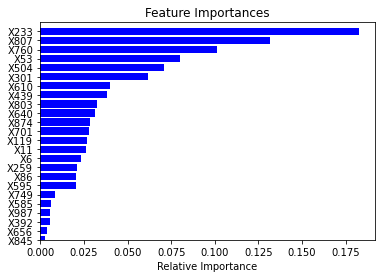

In [ ]:
importances = model.feature_importances_
indices = np.argsort(importances)
features = train_dataset.X
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [yaxis[i-1] for i in indices])
plt.xlabel('Relative Importance')
plt.ylim(base_graph, n_features)
plt.show()

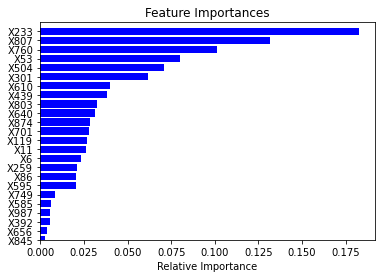

In [ ]:
importances = model.feature_importances_
indices = np.argsort(importances)
features = test_dataset.X
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [yaxis[i-1] for i in indices])
plt.xlabel('Relative Importance')
plt.ylim(base_graph, n_features)
plt.show()

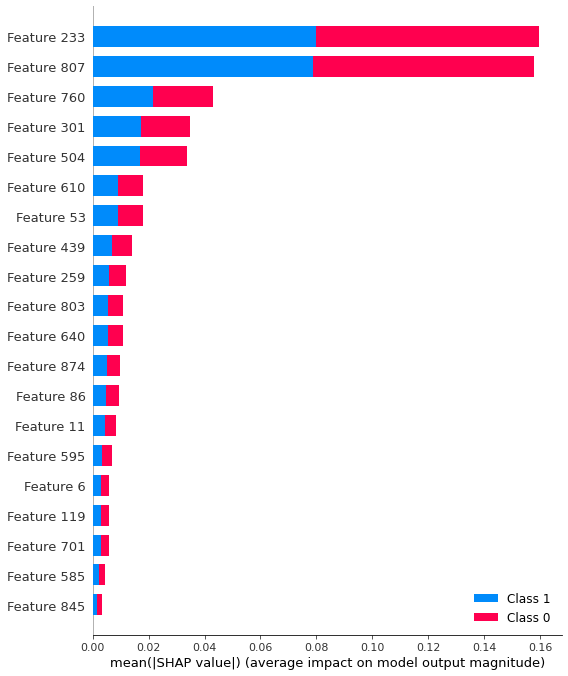

In [ ]:
shap_values = shap.TreeExplainer(model).shap_values(train_dataset.X)
shap.summary_plot(shap_values, train_dataset.X, plot_type="bar")

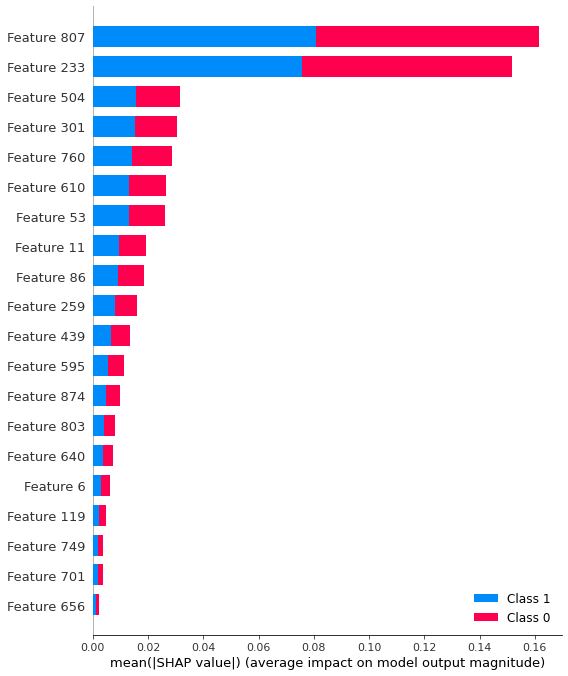

In [ ]:
shap_values = shap.TreeExplainer(model).shap_values(test_dataset.X)
shap.summary_plot(shap_values, test_dataset.X, plot_type="bar")

In [ ]:
active_id = np.where(test_dataset.y[:,0] == 1.0)
active_id

(array([  3,   4,   6,   7,   8,   9,  10,  11,  12,  15,  16,  17,  19,
         20,  21,  22,  23,  28,  29,  30,  33,  35,  38,  39,  41,  42,
         43,  44,  45,  46,  47,  48,  50,  51,  52,  53,  54,  55,  56,
         58,  65,  66,  67,  68,  69,  77,  78,  83,  84,  86,  87,  88,
         89,  95,  97,  98,  99, 100, 101, 104, 105, 106, 108, 113, 114,
        115, 122, 125, 128, 129, 136, 137, 139, 140, 141, 149, 150, 151,
        157, 158, 159, 161, 162, 163, 164, 165, 169, 171, 178, 180, 181,
        182, 187, 189, 190, 191, 192, 193, 194, 196, 197, 198, 199, 200,
        201, 202, 203]),)

In [ ]:
# 1d array to list
arr_1 = np.array(active_id[0])

print(f'NumPy Array:\n{arr_1}')

active_id_list = arr_1.tolist()

print(f'List: {active_id_list}')

NumPy Array:
[  3   4   6   7   8   9  10  11  12  15  16  17  19  20  21  22  23  28
  29  30  33  35  38  39  41  42  43  44  45  46  47  48  50  51  52  53
  54  55  56  58  65  66  67  68  69  77  78  83  84  86  87  88  89  95
  97  98  99 100 101 104 105 106 108 113 114 115 122 125 128 129 136 137
 139 140 141 149 150 151 157 158 159 161 162 163 164 165 169 171 178 180
 181 182 187 189 190 191 192 193 194 196 197 198 199 200 201 202 203]
List: [3, 4, 6, 7, 8, 9, 10, 11, 12, 15, 16, 17, 19, 20, 21, 22, 23, 28, 29, 30, 33, 35, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 54, 55, 56, 58, 65, 66, 67, 68, 69, 77, 78, 83, 84, 86, 87, 88, 89, 95, 97, 98, 99, 100, 101, 104, 105, 106, 108, 113, 114, 115, 122, 125, 128, 129, 136, 137, 139, 140, 141, 149, 150, 151, 157, 158, 159, 161, 162, 163, 164, 165, 169, 171, 178, 180, 181, 182, 187, 189, 190, 191, 192, 193, 194, 196, 197, 198, 199, 200, 201, 202, 203]


In [ ]:
Y_predict = pd.DataFrame(test_dataset.y, model.predict(test_dataset.X))

In [ ]:
active_id = np.where(test_dataset.y == 1.0)
len(active_id[0])

inactive_id = np.where(test_dataset.y == 0.0)
len(inactive_id[0])

total = len(active_id[0]) + len(inactive_id[0])

active_id_pred = np.where(model.predict(test_dataset.X) == 1.0)
len(active_id_pred[0])/total

0.8774509803921569

In [ ]:
inactive_id_pred = np.where(model.predict(test_dataset.X) == 0.0)
len(inactive_id_pred[0])/total

0.12254901960784313

In [ ]:
len(active_id_pred[0])/total + len(inactive_id_pred[0])/total

1.0

Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.


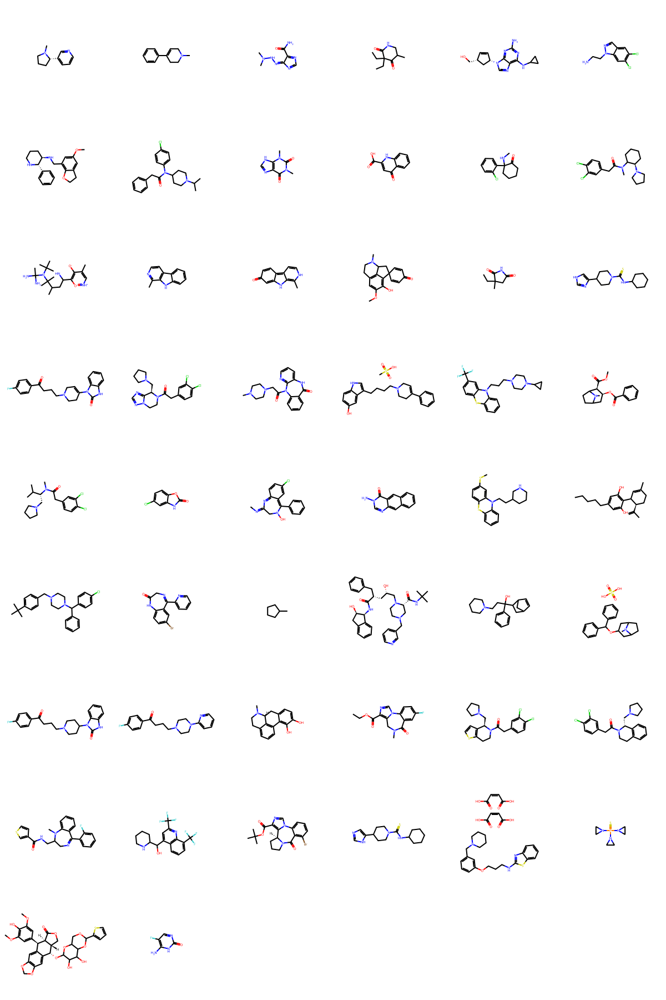

In [ ]:
mol_list = []
for id in active_id_list:
  mol = Chem.MolFromSmiles(test_dataset.ids[id])
  mol_list.append(mol)
img =Draw.MolsToGridImage(mol_list, molsPerRow = 6)
img

,smiles,id,Molecule
0,CN1CCC[C@H]1c2cccnc2,3,
1,CN1CCC(=CC1)c2ccccc2,4,
2,CN(C)N\N=C/1N=CN=C1C(N)=O,6,
3,CCC1(CC)C(=O)NCC(C)C1=O,7,
4,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,8,
5,c1(c(cc2n(ncc2c1)CCN)Cl)Cl,9,
6,c1c2CCOc2c(cc1OC)CN[C@@H]1CCCN[C@H]1c1ccccc1,10,
7,CC(C)N1CCC(CC1)N(C(=O)Cc2ccccc2)c3ccc(Cl)cc3,11,
8,n1(c(c2nc[nH]c2n(c1=O)C)=O)C,12,
9,OC(=O)C1=CC(=O)c2ccccc2N1,15,

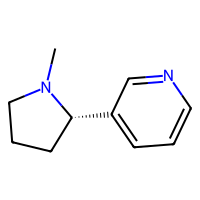
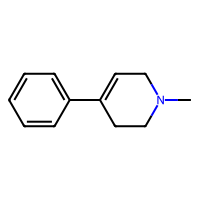
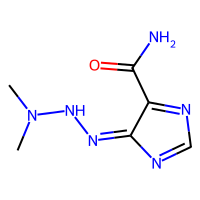
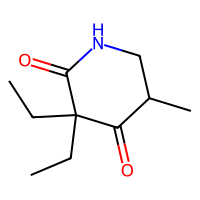
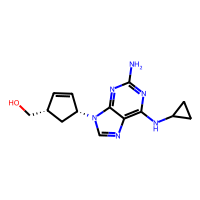
...
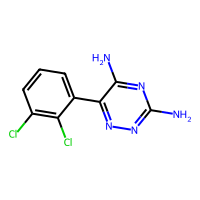
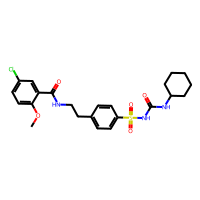
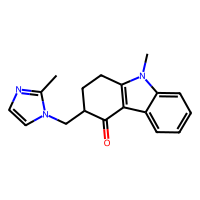
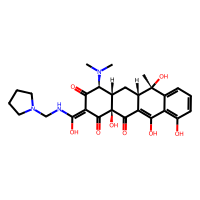
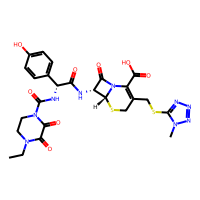

In [ ]:
df = pd.DataFrame({'smiles': test_dataset.ids[active_id_list], 'id': active_id_list})
PandasTools.AddMoleculeColumnToFrame(df,'smiles','Molecule')
df

In [ ]:
mols2grid.display(df, mol_col="Molecule")

MolGridWidget()

In [ ]:
from rdkit.Chem import Draw
from rdkit.Chem.Scaffolds import MurckoScaffold

def scaffold_svg(mol):
  scaffold = MurckoScaffold.GetScaffoldForMol(mol)
  d = Draw.MolDraw2DSVG(160, 120)
  d.DrawMolecule(scaffold)
  d.FinishDrawing()
  return d.GetDrawingText()

df["scaffold"] = df["Molecule"].apply(scaffold_svg)
mols2grid.display(df, mol_col="Molecule", subset=["mols2grid-id", "img", "scaffold"])

MolGridWidget()

,smiles,Molecule,Fragments
0,CN1CCC[C@H]1c2cccnc2,,figure3.png
1,CN(C)N\N=C/1N=CN=C1C(N)=O,,figure6.png
2,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,,figure8.png
3,c1c2CCOc2c(cc1OC)CN[C@@H]1CCCN[C@H]1c1ccccc1,,figure10.png
4,CC(C)N1CCC(CC1)N(C(=O)Cc2ccccc2)c3ccc(Cl)cc3,,figure11.png
5,n1(c(c2nc[nH]c2n(c1=O)C)=O)C,,figure12.png
6,OC(=O)C1=CC(=O)c2ccccc2N1,,figure15.png
7,CNC1(CCCCC1=O)c2ccccc2Cl,,figure16.png
8,CN(C1CCCC[C@H]1N2CCCC2)C(=O)Cc3ccc(Cl)c(Cl)c3,,figure17.png
9,[NH]C(CC(C)C([N@@](C(C)(C)C)C(N)(C)N)(C)C)c1c(...,,figure19.png

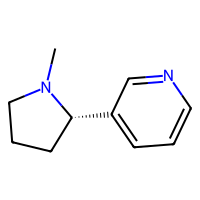
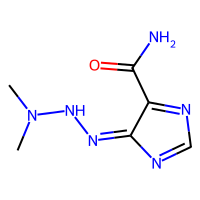
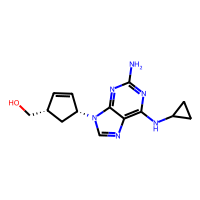
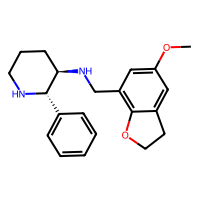
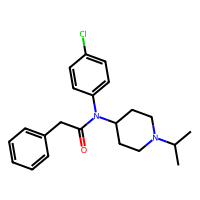
...
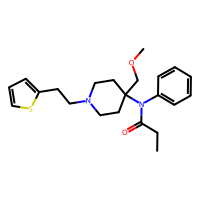
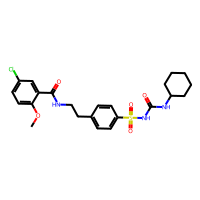
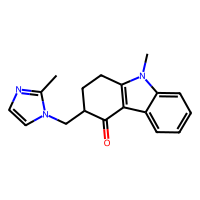
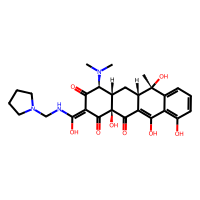
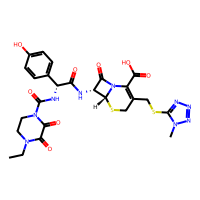

In [ ]:
figure_list = []
smiles_list = []
for id in active_id_list:
  bi = {}
  params = Chem.SmilesParserParams()
  params.removeHs = False
  m = Chem.MolFromSmiles(test_dataset.ids[id], params)
  if m is not None:
    Chem.Kekulize(m, clearAromaticFlags=True)
  fp = AllChem.GetMorganFingerprintAsBitVect(m, 2, nBits = 1024, bitInfo = bi)
  fp_arr = np.zeros((1,))
  DataStructs.ConvertToNumpyArray(fp, fp_arr)
  np.nonzero(fp_arr)
  list(fp.GetOnBits())

  #remover X e converter para inteiro
  caract=[]
  for linha in [yaxis[i-1] for i in indices]:
      nova_linha=linha.replace("X","")
      numero=int(nova_linha)
      caract.append(numero)
  caract.reverse()
  first_elem=caract[0:limite]
  legends = [int(x) for x in fp.GetOnBits()]
  #comparar feat_reverse com legends

  result = set(first_elem) & set(legends)
#  print(list(result))
# To remove the empty list
  if len(result) != 0:
     prints = [(m, x, bi) for x in list(result)]
     figure = Draw.DrawMorganBits(prints, molsPerRow = 4, legends = [str(x) for x in list(result)])
     figure.save("figure"+str(id)+".png","png")
     figure_list.append("figure"+str(id)+".png")
     smiles_list.append(test_dataset.ids[id])

df = pd.DataFrame({'smiles': smiles_list})
PandasTools.AddMoleculeColumnToFrame(df,'smiles','Molecule')
df['Fragments'] = figure_list
df

,smiles,Molecule,Fragments
0,CN1CCC[C@H]1c2cccnc2,,
1,CN(C)N\N=C/1N=CN=C1C(N)=O,,
2,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,,
3,c1c2CCOc2c(cc1OC)CN[C@@H]1CCCN[C@H]1c1ccccc1,,
4,CC(C)N1CCC(CC1)N(C(=O)Cc2ccccc2)c3ccc(Cl)cc3,,
5,n1(c(c2nc[nH]c2n(c1=O)C)=O)C,,
6,OC(=O)C1=CC(=O)c2ccccc2N1,,
7,CNC1(CCCCC1=O)c2ccccc2Cl,,
8,CN(C1CCCC[C@H]1N2CCCC2)C(=O)Cc3ccc(Cl)c(Cl)c3,,
9,[NH]C(CC(C)C([N@@](C(C)(C)C)C(N)(C)N)(C)C)c1c(c(c[nH+][o+]1)C)[O-],,

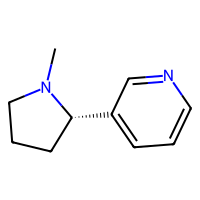
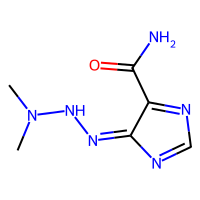
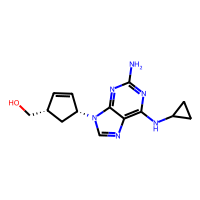
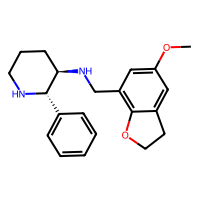
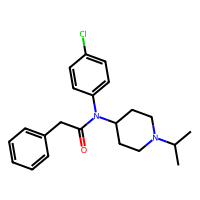
...
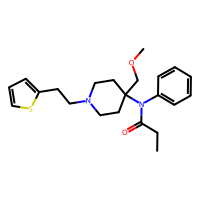
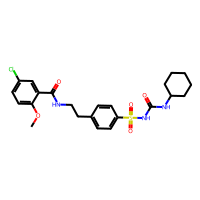
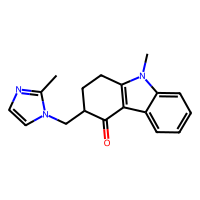
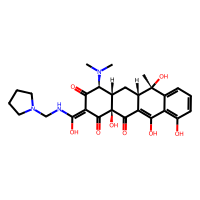
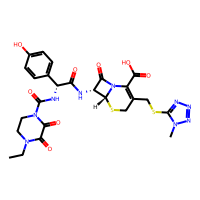

In [ ]:
from IPython.display import display,HTML,IFrame

# convert your links to html tags 
def path_to_image_html(path):
    return '<img src="'+ path + '" width="600" >'

df['Fragments'] = figure_list
image_cols = ['Molecule','Fragments']

pd.set_option('display.max_colwidth', None)

# Create the dictionariy to be passed as formatters
format_dict = {}
for image_col in image_cols:
    format_dict[image_col] = path_to_image_html


display(HTML(df.to_html(escape=False ,formatters=format_dict)))

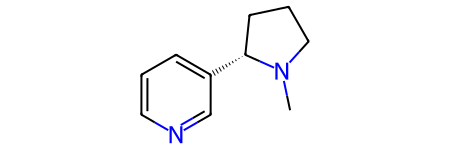

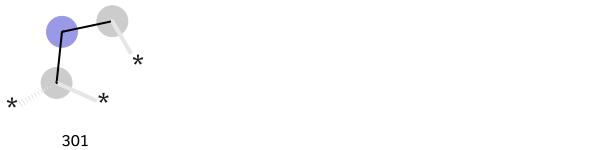

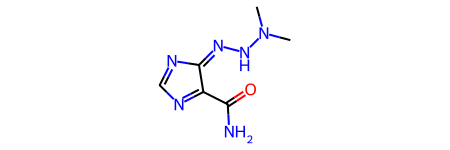

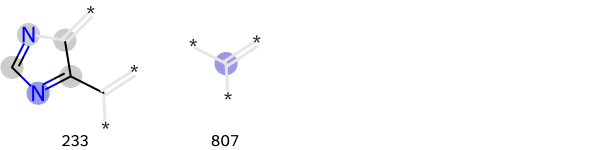

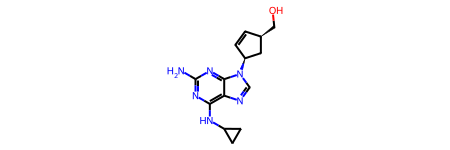

...

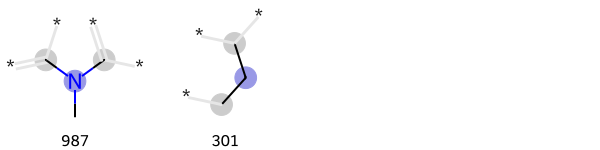

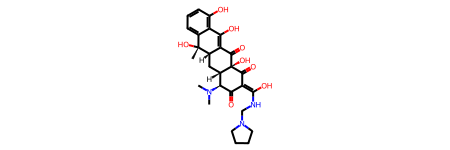

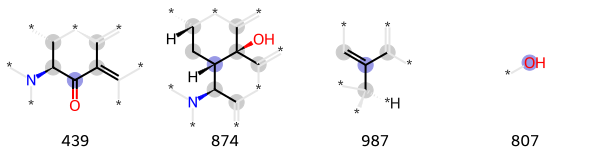

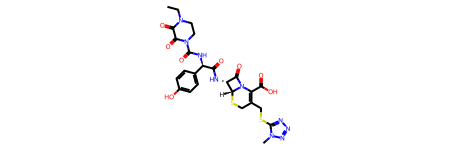

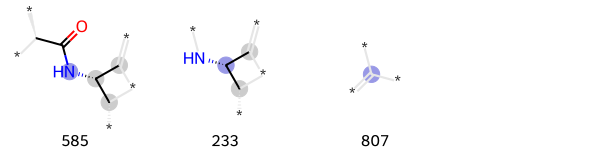

In [ ]:
figure_list = []
for id in active_id_list:
  bi = {}
  params = Chem.SmilesParserParams()
  params.removeHs = False
  m = Chem.MolFromSmiles(test_dataset.ids[id])
  if m is not None:
    Chem.Kekulize(m, clearAromaticFlags=True)
  fp = AllChem.GetMorganFingerprintAsBitVect(m, 2, nBits = 1024, bitInfo = bi)
  fp_arr = np.zeros((1,))
  DataStructs.ConvertToNumpyArray(fp, fp_arr)
  np.nonzero(fp_arr)
  list(fp.GetOnBits())

  #remover X e converter para inteiro
  caract=[]
  for linha in [yaxis[i-1] for i in indices]:
      nova_linha=linha.replace("X","")
      numero=int(nova_linha)
      caract.append(numero)
  caract.reverse()
  first_elem=caract[0:limite]
  legends = [int(x) for x in fp.GetOnBits()]
  #comparar feat_reverse com legends

  result = set(first_elem) & set(legends)
#  print(list(result))
# To remove the empty list
  if len(result) != 0:
     prints = [(m, x, bi) for x in list(result)]
     display(Chem.MolFromSmiles(test_dataset.ids[id]), Draw.DrawMorganBits(prints, molsPerRow = 4, legends = [str(x) for x in list(result)]))

In [ ]:
n_tasks = len(tasks)
n_features = train_dataset.get_data_shape()[0]
model = dc.models.MultitaskClassifier(n_tasks, n_features)
model.fit(train_dataset, nb_epoch=400)

0.03402590036392212

In [ ]:
metric = dc.metrics.Metric(dc.metrics.roc_auc_score, np.mean)
print("Train scores")
print(model.evaluate(train_dataset, [metric], transformers))
print("Validation scores")
print(model.evaluate(valid_dataset, [metric], transformers))

Train scores
{'mean-roc_auc_score': 0.9997711435110186}
Validation scores
{'mean-roc_auc_score': 0.8312548524844721}


In [ ]:
feature_names = ["fp_%s"  % x for x in range(1024)]
explainer = lime_tabular.LimeTabularExplainer(train_dataset.X, 
                                              feature_names=feature_names, 
                                              categorical_features=feature_names,
                                              class_names=['non-penetration', 'penetration'], 
                                              discretize_continuous=True)

In [ ]:
# We need a function which takes a 2d numpy array (samples, features) and returns predictions (samples,)
def eval_model(my_model):
    def eval_closure(x):
        ds = dc.data.NumpyDataset(x, n_tasks=1)
        # The 0th task is p_np
        predictions = my_model.predict(ds)[:,0]
        return predictions
    return eval_closure

model_fn = eval_model(model)

In [ ]:
def fp_mol(mol, fp_length=1024):
    """
    returns: dict of <int:list of string>
        dictionary mapping fingerprint index
        to list of SMILES strings that activated that fingerprint
    """
    d = {}
    feat = dc.feat.CircularFingerprint(sparse=True, smiles=True, size=1024)
    retval = feat._featurize(mol)
    for k, v in retval.items():
        index = k % fp_length
        if index not in d:
            d[index] = set()
        d[index].add(v['smiles'])
    return d

**LIME loop**

In [ ]:
fragment_list = []
for id in active_id_list:
    exp = explainer.explain_instance(test_dataset.X[id], model_fn, num_features=100, top_labels=1)
    key = list(exp.as_map().keys())[0]
    my_fragments = fp_mol(Chem.MolFromSmiles(test_dataset.ids[id]))
    fragment_weight = dict(exp.as_map()[key])
    for index in my_fragments:
        if index in fragment_weight:
           m = Chem.MolFromSmiles(test_dataset.ids[id])
           substructure = Chem.MolFromSmarts(list(my_fragments[index])[0])
           m.GetSubstructMatches(substructure)
           fragment_list.append({'id': id, 'Smiles': test_dataset.ids[id], 'p': key, 'index': index, 'fragments': my_fragments[index], 'weight': fragment_weight[index], 'Highlights': m})
df1 = pd.DataFrame(fragment_list)
df1

,id,Smiles,p,index,fragments,weight,Highlights
0,3,CN1CCC[C@H]1c2cccnc2,1,437,{cccnc},-0.117219,<rdkit.Chem.rdchem.Mol object at 0x7faf7b3be6d0>
1,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,883,{C=NC=NC},-0.129146,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415d60>
2,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,309,{CC(N)=O},0.068371,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415c80>
3,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,783,{C/C(N)=N\NN},0.019150,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415c10>
4,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,515,{CN(C)N},-0.053998,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415ba0>
5,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,139,{CN},0.092738,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415b30>
6,8,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,1,261,{cc(N)nc(n)N},0.111135,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415430>
7,8,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,1,700,{cc(c)n},0.102497,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415120>
8,10,c1c2CCOc2c(cc1OC)CN[C@@H]1CCCN[C@H]1c1ccccc1,1,347,{cc(c)[C@H](NC)[C@@H](C)N},-0.104938,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415ac0>
9,10,c1c2CCOc2c(cc1OC)CN[C@@H]1CCCN[C@H]1c1ccccc1,1,639,{cccc(c)C},0.090904,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415e40>


In [ ]:
mols2grid.display(df1, mol_col="Highlights", prerender = True)

MolGridWidget()

In [ ]:
df1.shape

(125, 7)

In [ ]:
df1['p'].sum()

104

In [ ]:
df1['p'].sum()/df1['p'].shape

array([0.832])

In [ ]:
PandasTools.SaveXlsxFromFrame(df1, 'bbbp(1)_fulllist.xlsx', molCol='Highlights', size=(100, 100))

files.download('bbbp(1)_fulllist.xlsx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df1 = df1.loc[(df1['p']) == 1]
df1

,id,Smiles,p,index,fragments,weight,Highlights
0,3,CN1CCC[C@H]1c2cccnc2,1,437,{cccnc},-0.117219,<rdkit.Chem.rdchem.Mol object at 0x7faf7b3be6d0>
1,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,883,{C=NC=NC},-0.129146,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415d60>
2,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,309,{CC(N)=O},0.068371,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415c80>
3,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,783,{C/C(N)=N\NN},0.019150,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415c10>
4,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,515,{CN(C)N},-0.053998,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415ba0>
5,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,139,{CN},0.092738,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415b30>
6,8,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,1,261,{cc(N)nc(n)N},0.111135,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415430>
7,8,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,1,700,{cc(c)n},0.102497,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415120>
8,10,c1c2CCOc2c(cc1OC)CN[C@@H]1CCCN[C@H]1c1ccccc1,1,347,{cc(c)[C@H](NC)[C@@H](C)N},-0.104938,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415ac0>
9,10,c1c2CCOc2c(cc1OC)CN[C@@H]1CCCN[C@H]1c1ccccc1,1,639,{cccc(c)C},0.090904,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415e40>


In [ ]:
mols2grid.display(df1, mol_col="Highlights", prerender = True)

MolGridWidget()

In [ ]:
df1 = df1.loc[(df1['weight']) > 0.0]
df1

,id,Smiles,p,index,fragments,weight,Highlights
2,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,309,{CC(N)=O},0.068371,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415c80>
3,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,783,{C/C(N)=N\NN},0.019150,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415c10>
5,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,139,{CN},0.092738,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415b30>
6,8,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,1,261,{cc(N)nc(n)N},0.111135,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415430>
7,8,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,1,700,{cc(c)n},0.102497,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415120>
9,10,c1c2CCOc2c(cc1OC)CN[C@@H]1CCCN[C@H]1c1ccccc1,1,639,{cccc(c)C},0.090904,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415e40>
10,10,c1c2CCOc2c(cc1OC)CN[C@@H]1CCCN[C@H]1c1ccccc1,1,194,{ccc(cc)OC},0.072959,<rdkit.Chem.rdchem.Mol object at 0x7faf7b4159e0>
13,17,CN(C1CCCC[C@H]1N2CCCC2)C(=O)Cc3ccc(Cl)c(Cl)c3,1,139,{CN},0.106753,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415970>
17,19,[NH]C(CC(C)C([N@@](C(C)(C)C)C(N)(C)N)(C)C)c1c(c(c[nH+][o+]1)C)[O-],1,287,{cc(C)c([O-])c(C)[o+]},0.103056,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415900>
19,20,Cc1nccc2c1[nH]c3ccccc23,1,223,{cc(c)[nH]c(c)c},0.029577,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415a50>


In [ ]:
mols2grid.display(df1, mol_col="Highlights", prerender = True)

MolGridWidget()

In [ ]:
df1.shape

(53, 7)

In [ ]:
#Unsetting set object of column fragments in df1
for (j,set_smiles) in enumerate(df1['fragments']): #el = set_smiles
  if  set_smiles == None or len(set_smiles) == 0:
       df1['fragments'].iloc[j] = np.nan

  elif len(set_smiles) > 1: #If fp is activated by more than one fragment
        k = j
        for smi in set_smiles:
            if smi != '': #Passing by possible bug (Empty smile)
               if k == j: #Represents the first smile of the set of smiles
                    df1['fragments'].iloc[k] = smi
                    k = df1.shape[0] #From now on k will be always the index of the new adding row
               else:
                     df1.loc[k] = df1.iloc[j] #copying data of original row (all the information, exept smile)
                     df1['fragments'].loc[k] = smi #modifying the fragment smile (which is still in set) to the smile alone (isolated) in the new position k
  else:
       df1['fragments'].iloc[j] = list(set_smiles)[0]


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
df1 = df1.drop_duplicates(subset=['fragments'], keep='first')
df1

,id,Smiles,p,index,fragments,weight,Highlights
2,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,309,CC(N)=O,0.068371,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415c80>
3,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,783,C/C(N)=N\NN,0.019150,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415c10>
5,6,CN(C)N\N=C/1N=CN=C1C(N)=O,1,139,CN,0.092738,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415b30>
6,8,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,1,261,cc(N)nc(n)N,0.111135,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415430>
7,8,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,1,700,cc(c)n,0.102497,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415120>
9,10,c1c2CCOc2c(cc1OC)CN[C@@H]1CCCN[C@H]1c1ccccc1,1,639,cccc(c)C,0.090904,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415e40>
10,10,c1c2CCOc2c(cc1OC)CN[C@@H]1CCCN[C@H]1c1ccccc1,1,194,ccc(cc)OC,0.072959,<rdkit.Chem.rdchem.Mol object at 0x7faf7b4159e0>
17,19,[NH]C(CC(C)C([N@@](C(C)(C)C)C(N)(C)N)(C)C)c1c(c(c[nH+][o+]1)C)[O-],1,287,cc(C)c([O-])c(C)[o+],0.103056,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415900>
19,20,Cc1nccc2c1[nH]c3ccccc23,1,223,cc(c)[nH]c(c)c,0.029577,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415a50>
20,21,CC1=C2NC3=CC(=O)C=CC3=C2C=CN1,1,692,cc(C)[nH],0.128927,<rdkit.Chem.rdchem.Mol object at 0x7faf7b415740>


In [ ]:
mols2grid.display(df1, mol_col="Highlights", prerender = True)

MolGridWidget()

In [ ]:
df1.shape

(42, 7)

,id,Smiles,p,index,fragments,weight,Highlights,Molecule
20,21,CC1=C2NC3=CC(=O)C=CC3=C2C=CN1,1,692,cc(C)[nH],0.137633,,
63,84,COc1cc(cc(OC)c1O)[C@H]2[C@@H]3[C@H](COC3=O)[C@H](OC4OC5COC(OC5C(O)C4O)c6sccc6)c7cc8OCOc8cc27,1,477,cc(c)[C@@H](OC)[C@H](C)C,0.137256,,
109,182,OC(=O)CCC(O)=O.FC(F)(F)c1ccc2Sc3ccccc3N(CCCN4CCN(CCC5OCCCO5)CC4)c2c1,1,446,CCCN(c)c,0.128609,,
73,95,[Ca++].NC1=NC(=O)C2=C(NCC(CNc3ccc(cc3)C(=O)N[C@@H](CCC([O-])=O)C([O-])=O)N2C=O)N1,1,334,cnc(N)[nH]c,0.128021,,
6,8,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,1,261,cc(N)nc(n)N,0.121832,,
17,19,[NH]C(CC(C)C([N@@](C(C)(C)C)C(N)(C)N)(C)C)c1c(c(c[nH+][o+]1)C)[O-],1,287,cc(C)c([O-])c(C)[o+],0.120422,,
76,98,CC[C@@]1(O)C(=O)OCC2=C1C=C3N(Cc4cc5c(CN(C)C)c(O)ccc5nc34)C2=O,1,477,cc(C)cc(c)c,0.116369,,
56,69,CC(C)(C)OC(=O)c1ncn2c3cccc(Br)c3C(=O)N4CCC[C@H]4c12,1,446,CCCCN,0.116198,,
70,89,CN1CC[C@]2(C)[C@H]1N(C)c3ccc(OC(=O)Nc4ccccc4)cc23,1,546,cc(c)[C@](C)(CC)C(N)N,0.115237,,
31,41,CC(C)[C@@H](CN1CCCC1)N(C)C(=O)Cc2ccc(Cl)c(Cl)c2,1,44,CC(C)[C@@H](C)N,0.111716,,

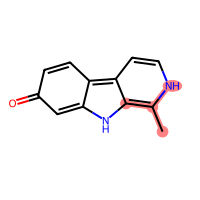
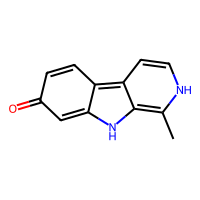
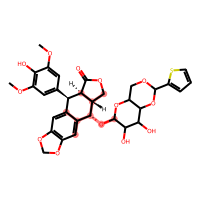
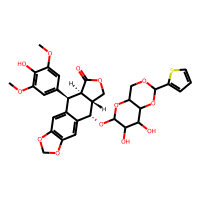
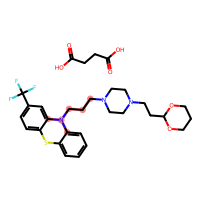
...
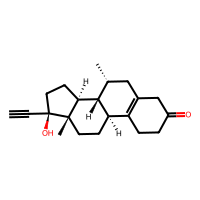
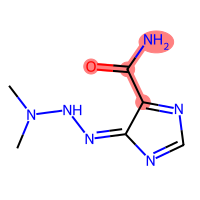
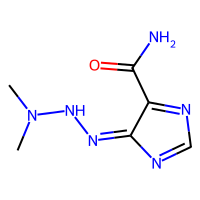
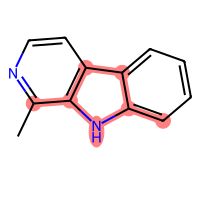
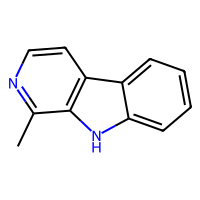

In [ ]:
df1 = df1.sort_values(by=['weight'],ascending=False)
PandasTools.AddMoleculeColumnToFrame(df1,'Smiles','Molecule')
df1

In [ ]:
mols2grid.display(df1, mol_col="Highlights", prerender = True)

MolGridWidget()


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,id,Smiles,p,index,fragments,weight,Highlights,Molecule
6,8,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,1,261,cc(N)nc(n)N,0.111135,,
7,8,Nc1nc(NC2CC2)c3ncn([C@@H]4C[C@H](CO)C=C4)c3n1,1,700,cc(c)n,0.102497,,
17,19,[NH]C(CC(C)C([N@@](C(C)(C)C)C(N)(C)N)(C)C)c1c(c(c[nH+][o+]1)C)[O-],1,287,cc(C)c([O-])c(C)[o+],0.103056,,
20,21,CC1=C2NC3=CC(=O)C=CC3=C2C=CN1,1,692,cc(C)[nH],0.128927,,
56,69,CC(C)(C)OC(=O)c1ncn2c3cccc(Br)c3C(=O)N4CCC[C@H]4c12,1,446,CCCCN,0.114345,,
60,78,OC(=O)\C=C/C(O)=O.OC(=O)\C=C/C(O)=O.C1CCN(CC1)Cc2cccc(OCCCNc3sc4ccccc4n3)c2,1,156,cc(c)sc(n)N,0.106958,,
63,84,COc1cc(cc(OC)c1O)[C@H]2[C@@H]3[C@H](COC3=O)[C@H](OC4OC5COC(OC5C(O)C4O)c6sccc6)c7cc8OCOc8cc27,1,477,cc(c)[C@@H](OC)[C@H](C)C,0.133298,,
72,89,CN1CC[C@]2(C)[C@H]1N(C)c3ccc(OC(=O)Nc4ccccc4)cc23,1,546,cc(c)[C@](C)(CC)C(N)N,0.109409,,
75,95,[Ca++].NC1=NC(=O)C2=C(NCC(CNc3ccc(cc3)C(=O)N[C@@H](CCC([O-])=O)C([O-])=O)N2C=O)N1,1,334,cnc(N)[nH]c,0.127537,,
83,104,Cc1noc(N[S](=O)(=O)c2ccc(N)cc2)c1C,1,92,cc(C)n,0.112084,,

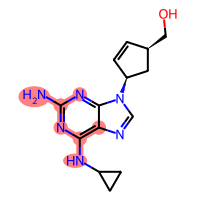
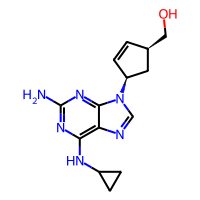
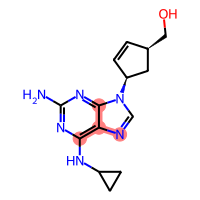
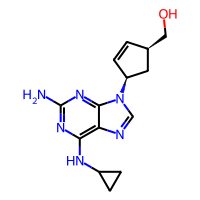
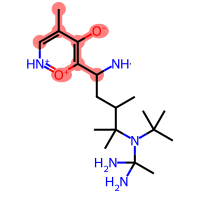
...
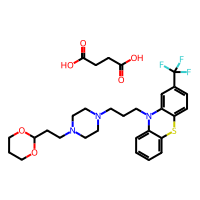
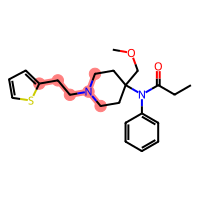
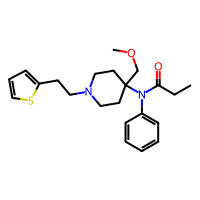
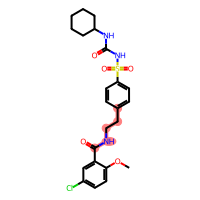
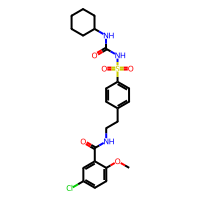

In [ ]:
df1_filtered = df1.loc[(df1['weight']) > 0.1]
PandasTools.AddMoleculeColumnToFrame(df1_filtered,'Smiles','Molecule')
df1_filtered

In [ ]:
mols2grid.display(df1_filtered, mol_col="Highlights", prerender = True)

MolGridWidget()

In [ ]:
df1_filtered.shape

(13, 8)

In [ ]:
PandasTools.SaveXlsxFromFrame(df1, 'bbbp(1)_list.xlsx', molCol='Highlights', size=(100, 100))
files.download('bbbp(1)_list.xlsx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
PandasTools.SaveXlsxFromFrame(df1_filtered, 'bbbp(1)_list_filtered.xlsx', molCol='Highlights', size=(100, 100))
files.download('bbbp(1)_list_filtered.xlsx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>